In [2]:
import numpy as np
from scipy.linalg import lu
import matplotlib.pyplot as plt

In [3]:
A = np.array([[2, 1, 1, 0],
              [4, 3, 3, 1],
              [8, 7, 9, 5],
              [6, 7, 9, 8]])

In [4]:
P, L, U = lu(A)

In [5]:
P

array([[0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.]])

In [6]:
L

array([[ 1.        ,  0.        ,  0.        ,  0.        ],
       [ 0.75      ,  1.        ,  0.        ,  0.        ],
       [ 0.5       , -0.28571429,  1.        ,  0.        ],
       [ 0.25      , -0.42857143,  0.33333333,  1.        ]])

In [7]:
U

array([[ 8.        ,  7.        ,  9.        ,  5.        ],
       [ 0.        ,  1.75      ,  2.25      ,  4.25      ],
       [ 0.        ,  0.        , -0.85714286, -0.28571429],
       [ 0.        ,  0.        ,  0.        ,  0.66666667]])

In [8]:
Q, R = np.linalg.qr(A)

In [9]:
L_inv = np.linalg.inv(L)
print(L_inv)

[[ 1.          0.          0.          0.        ]
 [-0.75        1.          0.          0.        ]
 [-0.71428571  0.28571429  1.          0.        ]
 [-0.33333333  0.33333333 -0.33333333  1.        ]]


In [10]:
L_inv[-1, :] @ P @ Q[:, -1]

0.7698003589195035

In [11]:
Q

array([[-1.82574186e-01, -4.65474668e-01,  4.59522381e-15,
        -8.66025404e-01],
       [-3.65148372e-01, -3.93863181e-01,  7.92593924e-01,
         2.88675135e-01],
       [-7.30296743e-01, -2.50640206e-01, -5.66138517e-01,
         2.88675135e-01],
       [-5.47722558e-01,  7.51920618e-01,  2.26455407e-01,
        -2.88675135e-01]])

In [12]:
def lq(m, n):
    A = np.random.normal(loc=0.0, scale=1.0, size=(m, n))
    P, L, U = lu(A)
    Q, R = np.linalg.qr(A)
    L_inv = np.linalg.inv(L)
    return L_inv, Q, P
    

In [13]:
L_inv_lst = list()
Q_lst = list()
P_lst = list()
L_invPQ = list()
for i in range(2, 1000):
        L_inv, Q, P = lq(i, i)
        P_lst.append(P)
        L_inv_lst.append(L_inv[-1, :])
        Q_lst.append(Q[:, -1])
        val = L_inv[-1, :] @ P @ Q[:, -1]
        # print(val)
        L_invPQ.append(val)

In [14]:
L_inv_PQ = np.array(L_invPQ)

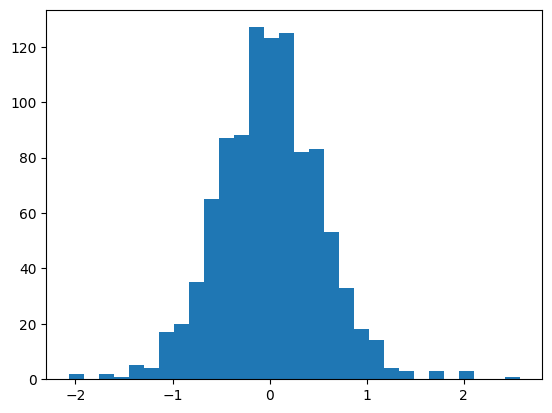

In [15]:
plt.hist(L_inv_PQ, bins=30);

In [16]:
L_inv_norm_lst = list()
Q_norm_lst = list()
for i in range(998):
    L_inv_norm_lst.append(np.linalg.norm(L_inv_lst[i]))
    Q_norm_lst.append(np.linalg.norm(Q_lst[i]))

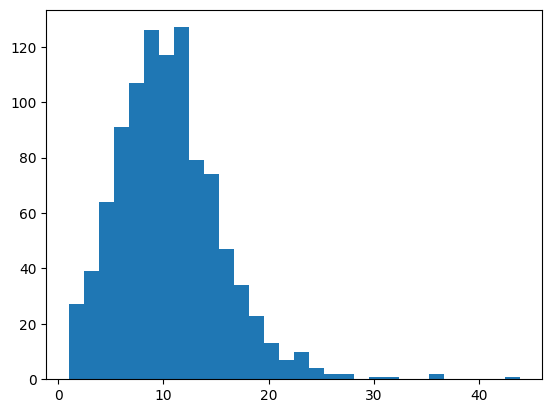

In [17]:
L_inv_norm_lst = np.array(L_inv_norm_lst)
plt.hist(L_inv_norm_lst, bins=30);

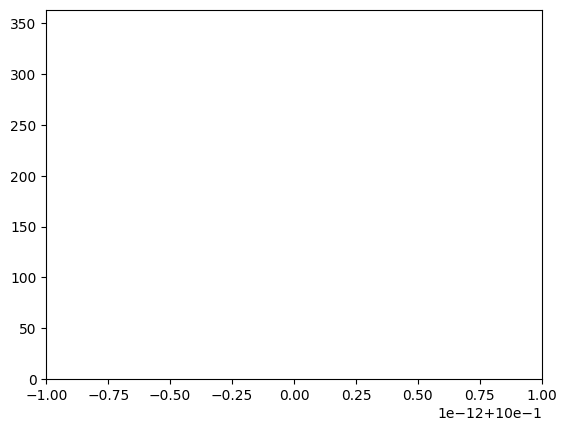

In [18]:
Q_norm_lst = np.array(Q_norm_lst)
plt.hist(Q_norm_lst, bins=30);

In [19]:
Q_norm_lst

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [23]:
result = []
for idx, lst in enumerate(L_inv_lst):
    result.append(lst/Q_lst[idx])

In [24]:
result

[array([1.00237073, 1.00237073]),
 array([3.44031733, 0.39315177, 1.16299908]),
 array([2.23149787, 2.10676172, 0.59172043, 1.74457568]),
 array([ 3.43152953,  0.90726863,  0.75279003, -0.11179848,  6.15764779]),
 array([-0.70071435,  0.26289132, -7.92816716, -0.35637893, -1.58376867,
         6.73569695]),
 array([  3.14503946,   0.14754646,   1.47907753, -11.35342111,
          0.29117316,   1.47907753,  -4.61446885]),
 array([ 1.40111944,  0.93778924,  0.49885644,  2.37141156, -4.6800039 ,
         2.02965323, -9.55679899,  2.04094508]),
 array([-2.70945648, -2.12799423,  4.6268175 , -1.37213087, -3.37973583,
        -1.84271751, -2.12291576, -0.72103041,  2.56434009]),
 array([  1.52068254,   2.00556273,   2.11008343,  -0.387334  ,
          3.08052027,  -1.21157297,   2.11008343,  -3.67493513,
        -11.49512325,   2.11008343]),
 array([ 1.09136676e+00, -4.72742042e-03,  2.90624132e+00, -3.09084353e+00,
        -1.67284393e-01, -2.42299596e-01, -3.85358040e-01, -1.21877375e+01,
